# Uso da yolo

Imagem escolhida: dataset/images/test/784_image.png


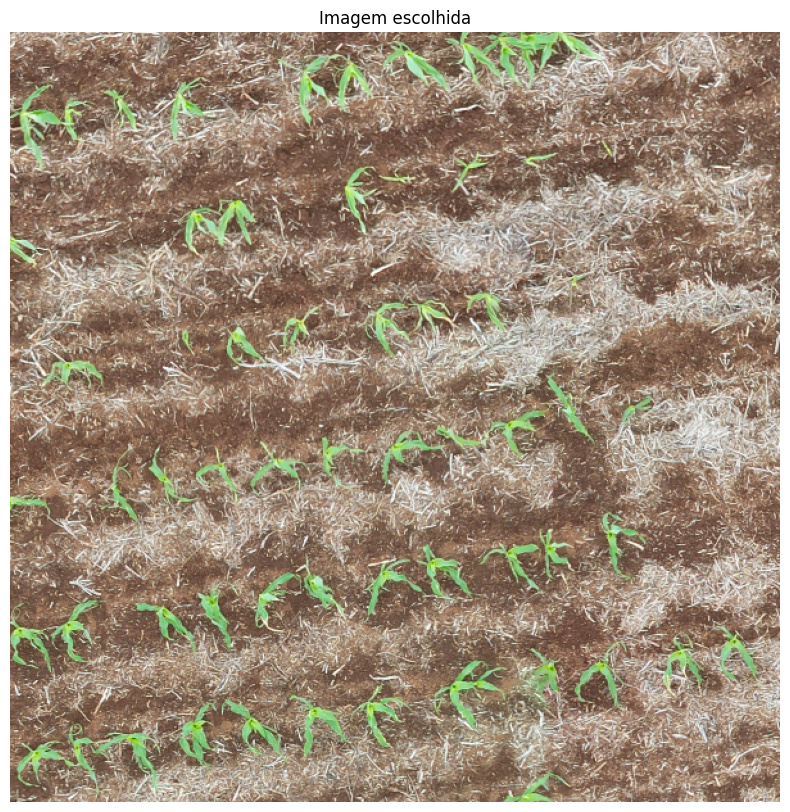

In [2]:
import os
import random
import cv2
import numpy as np
from ultralytics import YOLO
from matplotlib import pyplot as plt

# Caminho para a pasta de teste
test_folder = 'dataset/images/test'
imagens_test = [f for f in os.listdir(test_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
img_nome = random.choice(imagens_test)
img_path = os.path.join(test_folder, img_nome)
print(f'Imagem escolhida: {img_path}')

# Carrega imagem original
img = cv2.imread(img_path)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Imagem escolhida')
plt.show()

# Segmentando Plantas


image 1/1 /home/angelo/Documents/yolotestes/dataset/images/test/784_image.png: 608x608 57 milhos, 1597.5ms
Speed: 10.6ms preprocess, 1597.5ms inference, 31.0ms postprocess per image at shape (1, 3, 608, 608)


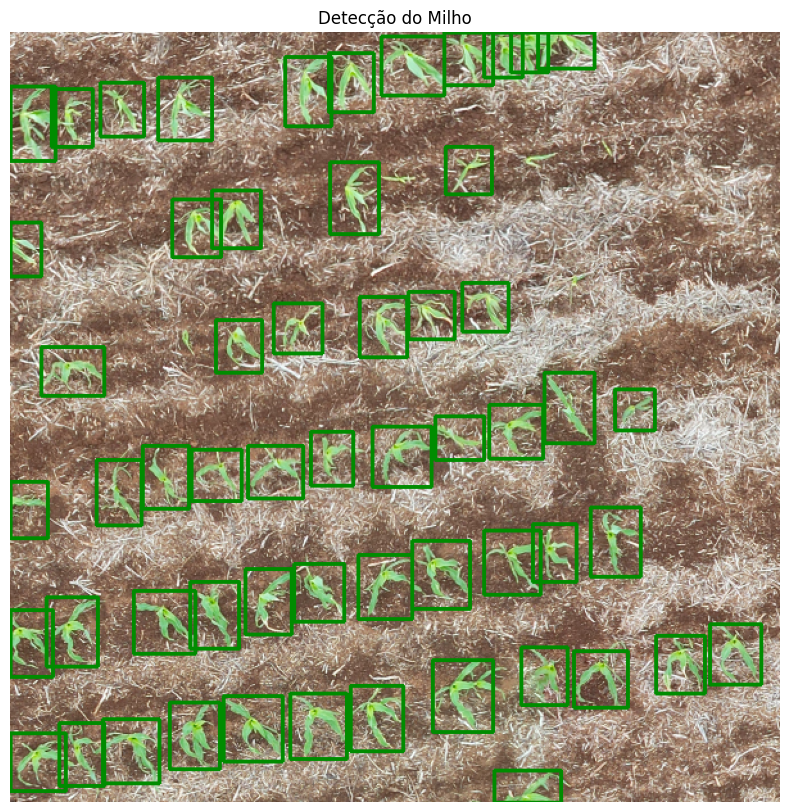

In [3]:

# Carrega o modelo
model = YOLO('v8s_augmentado.pt')
results = model(img_path)[0]

# Obtem as bounding boxes (xyxy), confidences e classes
boxes = results.boxes.xyxy.cpu().numpy()  # (x1, y1, x2, y2)
scores = results.boxes.conf.cpu().numpy()
classes = results.boxes.cls.cpu().numpy().astype(int)

# Verifica sobreposição
def iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea + 1e-6)
    return iou


# Desenha as caixas e centros
for idx, box in enumerate(boxes):
    x1, y1, x2, y2 = map(int, box)

    if classes[idx]:
        color = (0, 140, 255) 
    else:
        color=(0, 140, 0)
    # Desenhar bounding box
    cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
    

# Exibe com matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Detecção do Milho')
plt.show()

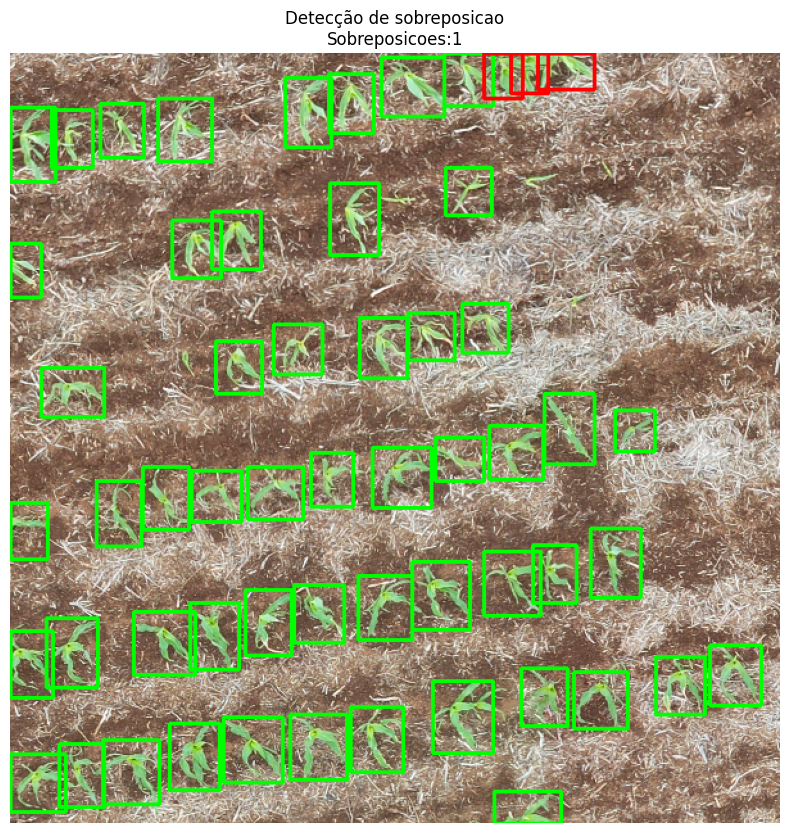

In [4]:
img = cv2.imread(img_path)
# Verifica sobreposição
def iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea + 1e-6)
    return iou

# Verifica quais caixas se sobrepõem
overlapping_indices = set()
for i in range(len(boxes)):
    for j in range(i + 1, len(boxes)):
        if iou(boxes[i], boxes[j]) > 0.1:  # limiar ajustável
            overlapping_indices.add(i)
            overlapping_indices.add(j)

# Desenha as caixas
cont = 0
for idx, box in enumerate(boxes):
    x1, y1, x2, y2 = map(int, box)
    if idx in overlapping_indices:
        color = (0, 0, 255)
        cont+=1
    else:
        color = (0, 255, 0)
    if classes[idx]:
        color = (0, 140, 255)  # opcional: laranja se for outra classe
    
    # Desenhar bounding box
    cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
    
# Exibe com matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f'Detecção de sobreposicao\nSobreposicoes:{int(cont/2)}')
plt.show()


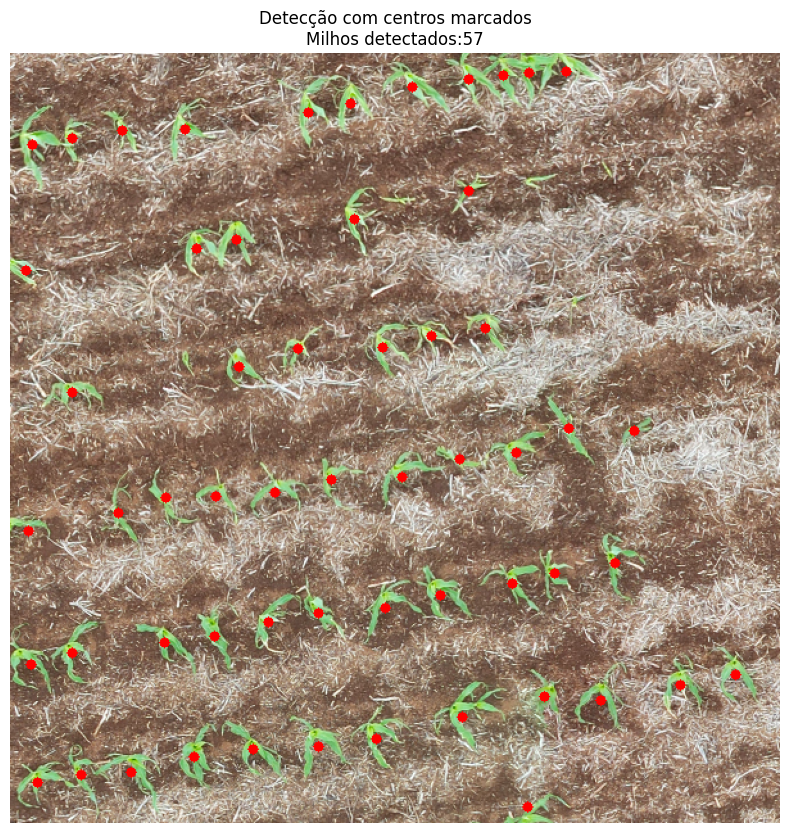

In [5]:
img = cv2.imread(img_path)
# Desenha as caixas e centros
plantas = []
for idx, box in enumerate(boxes):
    x1, y1, x2, y2 = map(int, box)
    if not classes[idx]:
        # Apenas milho    
        # Calcular centro e desenhar ponto roxo
        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)
        plantas.append((center_x, center_y))
        cv2.circle(img, (center_x, center_y), radius=4, color=(0, 0, 255), thickness=-1)  # vermelho

# Exibe com matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f'Detecção com centros marcados\nMilhos detectados:{len(plantas)}')
plt.show()



[(240, 540), (189, 542), (357, 20), (143, 548), (285, 534), (460, 504), (313, 26), (265, 39), (159, 454), (435, 292), (21, 568), (120, 459), (206, 342), (176, 145), (16, 476), (145, 152), (565, 484), (335, 422), (290, 229), (201, 443), (48, 467), (391, 413), (232, 46), (394, 311), (240, 436), (292, 432), (17, 71), (48, 264), (136, 59), (268, 129), (160, 345), (87, 60), (178, 244), (94, 560), (471, 397), (328, 220), (305, 330), (522, 492), (55, 562), (424, 405), (121, 346), (370, 214), (384, 17), (250, 332), (84, 358), (416, 501), (224, 230), (433, 14), (403, 587), (352, 517), (48, 66), (12, 169), (357, 107), (14, 372), (486, 294), (404, 15), (350, 316)]
155.13630342824814


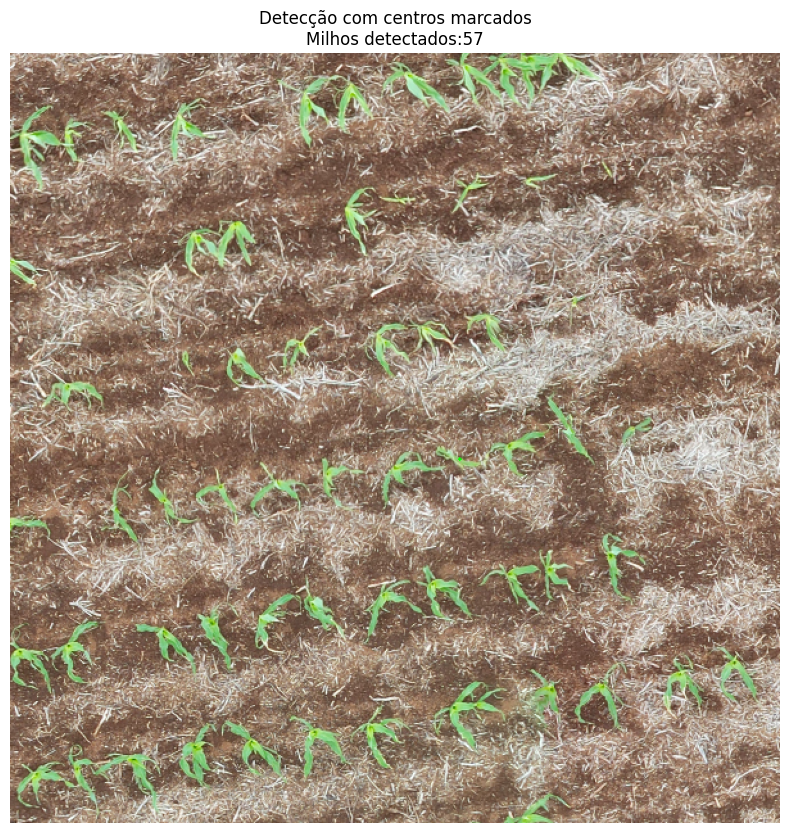

In [ ]:
import statistics
import math
print(plantas)
img = cv2.imread(img_path)
def distance(a,b):
    x1 = a[0]
    x2 = b[0]
    y1 = a[1]
    y2 = b[1]
    return ((x1-x2)**2+(y1-y2)**2)**0.5
# Sintaxe: cv2.line(imagem, ponto_inicial, ponto_final, cor, espessura)
# cv2.line(img, (100, 100), (400, 400), (0, 255, 0), 2)
DIRECOES = set()
for point in plantas:
    for piontb in plantas:
        dist = distance(point,piontb)
        if dist < 50 and dist > 20:
            if not (piontb,point) in DIRECOES:
                DIRECOES.add((point,piontb))
angulos = []
def calcule_angulo(direction):
    (x1, y1), (x2, y2) = direction
    dx = x2 - x1
    dy = y2 - y1
    angulo_rad = math.atan2(dy, dx)  # ângulo em radianos
    angulo_graus = math.degrees(angulo_rad)  # converte para graus
    return angulo_graus
for diretion in DIRECOES:
    angulos.append(calcule_angulo(diretion))
angulo = statistics.median(angulos)
print(angulo)
def trace(angulo):
    return (100*angulo+5,300*angulo+5)
point,piontb = trace(angulo)
cv2.line(img, point, piontb, (0, 255, 0), 2)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f'Detecção com centros marcados\nMilhos detectados:{len(plantas)}')
plt.show()